<a href="https://colab.research.google.com/github/mirnanoukari/ArUco-Pose-Detection/blob/main/STDSR_2023_Assignment_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# STDSR-2023-Assignment 2
## B19-RO-01
## Mirna Alnoukari
### m.alnoukari@innopolis.university

# Task 1

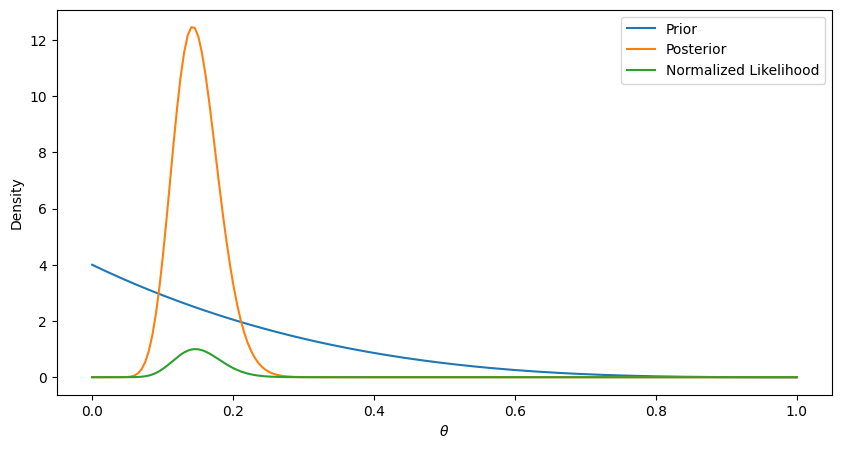

In [34]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import beta, binom

# Define the prior distribution
a_prior = 1
b_prior = 4
prior = beta(a_prior, b_prior)

# Define the likelihood function
n = 116
x = 17
likelihood = lambda theta: binom.pmf(x, n, theta)

# Define the posterior distribution
a_post = a_prior + x
b_post = b_prior + n - x
posterior = beta(a_post, b_post)

# Define the normalized likelihood
theta_grid = np.linspace(0, 1, 200)
norm_likelihood = likelihood(theta_grid) / likelihood(theta_grid).max()

# Plot the prior, posterior, and normalized likelihood
plt.figure(figsize=(10, 5))
plt.plot(theta_grid, prior.pdf(theta_grid), label='Prior')
plt.plot(theta_grid, posterior.pdf(theta_grid), label='Posterior')
plt.plot(theta_grid, norm_likelihood, label='Normalized Likelihood')
plt.xlabel(r'$\theta$')
plt.ylabel('Density')
plt.legend()
plt.show()

In [39]:
import scipy.stats as stats

alpha_post = 18
beta_post = 103

credible_interval = stats.beta.interval(0.95, alpha_post, beta_post)
print("The central 95% posterior credible interval for θ is",credible_interval)

The central 95% posterior credible interval for θ is (0.09138957252823, 0.21710689824337648)


# Task 2

In [5]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import random
import json
import time

In [6]:
# Read the CSV file containing city data into a pandas DataFrame
df = pd.read_csv("city.csv")
# Select the 30 most populated cities (mpc)
mpc = df.sort_values(by=['population'], ascending=False)[:30]
mpc.head()

,address,postal_code,country,federal_district,region_type,region,area_type,area,city_type,city,...,fias_level,capital_marker,okato,oktmo,tax_office,timezone,geo_lat,geo_lon,population,foundation_year
509,г Москва,101000.0,Россия,Центральный,г,Москва,NaN,NaN,NaN,NaN,...,1,0,45000000000,45000000,7700,UTC+3,55.754047,37.620405,11514330,1147
786,г Санкт-Петербург,190000.0,Россия,Северо-Западный,г,Санкт-Петербург,NaN,NaN,NaN,NaN,...,1,0,40000000000,40000000,7800,UTC+3,59.939131,30.315900,4848742,1703
647,г Новосибирск,630000.0,Россия,Сибирский,обл,Новосибирская,NaN,NaN,г,Новосибирск,...,4,2,50401000000,50701000001,5400,UTC+7,55.028191,82.921149,1498921,1893
832,г Екатеринбург,620000.0,Россия,Уральский,обл,Свердловская,NaN,NaN,г,Екатеринбург,...,4,2,65401000000,65701000001,6600,UTC+5,56.838522,60.605491,1377738,1723
619,г Нижний Новгород,603000.0,Россия,Приволжский,обл,Нижегородская,NaN,NaN,г,Нижний Новгород,...,4,2,22401000000,22701000001,5200,UTC+3,56.324063,44.005391,1250615,1221


In [7]:
# Extract the city names from the DataFrame and store them in a list
cities = mpc["address"].tolist()

# Remove the prefix 'г' from the city names
cities = [city.split("г ")[-1] for city in cities]

# Extract the latitude and longitude of the cities from the DataFrame
cities_lon = mpc["geo_lon"].tolist()
cities_lat = mpc["geo_lat"].tolist()

# Create a dictionary with city names as keys and their coordinates as values
cities_dict = {city: [cities_lon[i], cities_lat[i]] for i, city in enumerate(cities)}

In [8]:
def calc_distance(lon1, lat1, lon2, lat2):
    """
    Calculates the distance between two cities using their longitude and latitude
    """
    R = 6371  # Radius of the Earth in kilometers
    lat1, lon1, lat2, lon2 = np.deg2rad((lat1, lon1, lat2, lon2))
    d = np.arccos(np.sin(lat1) * np.sin(lat2) + np.cos(lat1) * np.cos(lat2) * np.cos(lon1 - lon2))
    return d * R

def total_distance(coords):
    """
    Computes the total distance of a path that visits each city in the given order
    """
    path_len = 0
    for i in range(len(coords) - 1):
        path_len += calc_distance(coords[i][0], coords[i][1], coords[i + 1][0], coords[i + 1][1])
    return path_len

In [9]:
!pip install Basemap

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 860.6/860.6 kB 41.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.5/46.5 kB 6.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 30.5/30.5 MB 29.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.7/7.7 MB 93.9 MB/s eta 0:00:00


In [10]:
from mpl_toolkits.basemap import Basemap

# Load Russia coordinates from a file
with open('russia.json') as f:
    russia_data = json.load(f)[0]['geojson']['coordinates']

# Flatten the coordinates list and convert to a NumPy array
russia_coord = np.array([coord for sublist in russia_data for coord in sublist[0]])

# Adjust longitudes to ensure proper display on a map
russia_coord[:, 0] += (russia_coord[:, 0] < 0) * 360

def plot(coords, length, rate, time_taken):
    # Extract city coordinates from the input array
    x, y = coords[:, 0], coords[:, 1]

    # Create a new plot
    fig, ax = plt.subplots(figsize=(30, 15))

    # Set the plot boundaries to show only Russia and borders
    min_lon, max_lon = russia_coord[:, 0].min(), russia_coord[:, 0].max()
    min_lat, max_lat = russia_coord[:, 1].min(), russia_coord[:, 1].max()

    m = Basemap(projection='mill', llcrnrlon=min_lon, llcrnrlat=min_lat, urcrnrlon=max_lon, urcrnrlat=max_lat, resolution='l')

    # Load and plot the Earth image
    m.bluemarble()

    # Plot Russia boundaries
    m.drawcoastlines()
    m.drawcountries()
    m.drawstates()

    # Add title with information about the path
    ax.set_title(f"Path: length = {length:.2f} km, rate = {rate}, time = {time_taken:.2f} s", fontsize=20)

    # Add axis labels
    ax.set_xlabel("Longitude", fontsize=20)
    ax.set_ylabel("Latitude", fontsize=20)

    # Convert city coordinates to the map projection
    x_map, y_map = m(x, y)

    # Plot the path and cities
    ax.plot(x_map, y_map, linewidth=2)
    ax.scatter(x_map[:-1], y_map[:-1], s=30, c='orange')

    # Annotate the cities with their names
    for i, city in enumerate(cities):
        ax.annotate(city, m(cities_dict[city][0], cities_dict[city][1]), fontsize=12,  color='white')

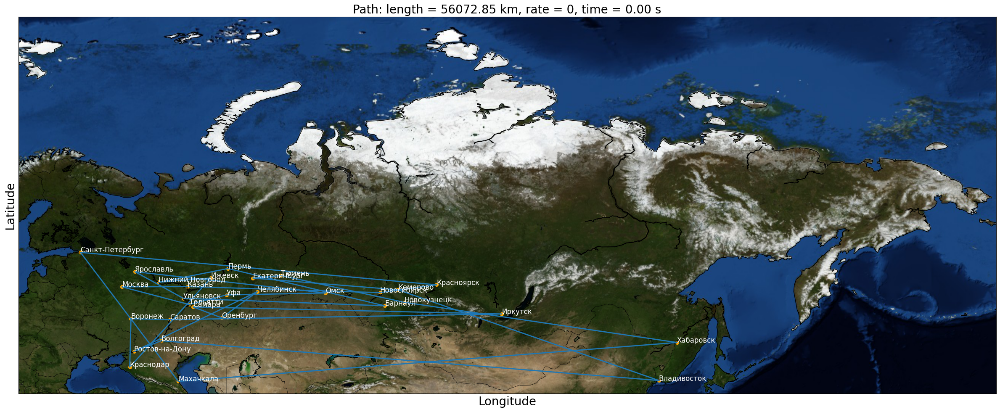

In [11]:
# We only need coordinates for computation, so we omit city names and only keep coordinates
city_coords = list(cities_dict.values())
# Shuffle city order
random.shuffle(city_coords)
# We need to add the initial city as the last element of the path because the salesman must return to it
city_coords.append(city_coords[0])

# Get the longitudes and latitudes of the initial random path
init_long = np.array(city_coords)[:, 0]
init_lat = np.array(city_coords)[:, 1]

# Plot the initial random path with the computed distance
plot(np.array(city_coords), total_distance(city_coords), 0, 0)

### Simulated Annealing Algorithm

In [30]:
def simulated_annealing(initial_coords, start_temp, end_temp, cooling_rate):
    # Set the initial path and its length as current path and current path length
    current_coords = initial_coords[:]
    current_path_length = total_distance(current_coords)

    # Store all intermediate paths and their lengths for animation
    all_coords = [np.array(current_coords)]
    all_path_lengths = [current_path_length]

    # Track execution time
    time_arr = [time.time()]

    while start_temp > end_temp:
        # Print the current path length
        print(f"Current path length: {current_path_length} km", end=' \r')

        # Copy the current path to switch two random cities
        new_coords = current_coords[:-1].copy()
        city_idx1, city_idx2 = random.sample(range(len(cities)), 2)
        new_coords[city_idx1], new_coords[city_idx2] = new_coords[city_idx2], new_coords[city_idx1]

        # Compute acceptance ratio by adding the initial city at path end
        new_coords.append(new_coords[0])

        # New path length
        new_path_length = total_distance(new_coords)

        # Path lengths difference
        delta_length = new_path_length - current_path_length

        # Acceptance probability
        acceptance_probability = np.exp(-delta_length / start_temp)
        random_number = random.random()

        # Update the current path if the random number is smaller than the acceptance probability
        if random_number <= acceptance_probability:
            current_coords = new_coords.copy()
            current_path_length = new_path_length

        # Decrease temperature
        start_temp = start_temp * cooling_rate

        all_coords.append(np.array(current_coords))
        all_path_lengths.append(current_path_length)
        time_arr.append(time.time())

    # Compute execution time for each step
    time_arr = np.array(time_arr)
    time_arr -= time_arr[0]

    return all_coords, all_path_lengths, time_arr

###  Different values of the annealing rate

In [31]:
# Define the initial and final temperature
init_temp = 10000
fin_temp = 1

# Define the cooling ratios
slow_cool = 0.99
fast_cool = 0.8
mid_cool = 0.9

# Run simulated annealing with different cooling ratios
fast_coords, fast_lengths, fast_time = simulated_annealing(city_coords, init_temp, fin_temp, fast_cool)
mid_coords, mid_lengths, mid_time = simulated_annealing(city_coords, init_temp, fin_temp, mid_cool)
slow_coords, slow_lengths, slow_time = simulated_annealing(city_coords, init_temp, fin_temp, slow_cool)

<ipython-input-30-14d7129cd04f>:32: RuntimeWarning: overflow encountered in exp
  acceptance_probability = np.exp(-delta_length / start_temp)


#### Fast Cooling

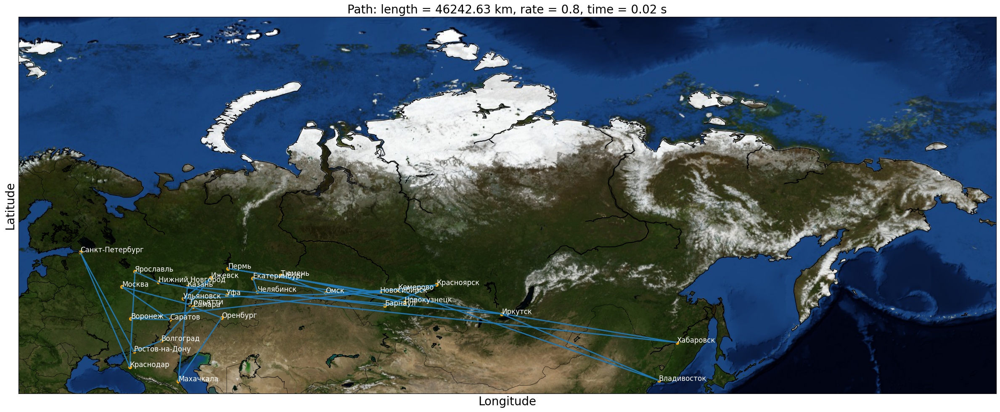

In [32]:
# Plot the final paths and lengths for each cooling ratio
plot(fast_coords[-1], fast_lengths[-1], fast_cool, fast_time[-1])


#### Medium Cooling

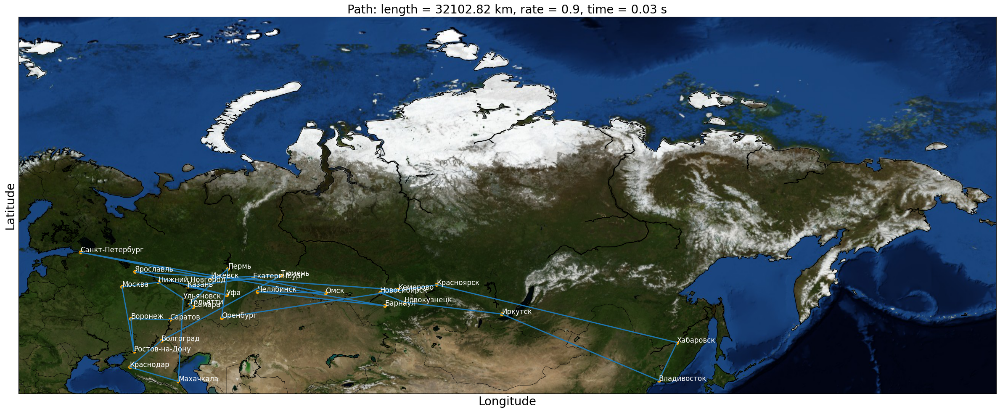

In [22]:
plot(mid_coords[-1], mid_lengths[-1], mid_cool, mid_time[-1])

#### Slow Cooling

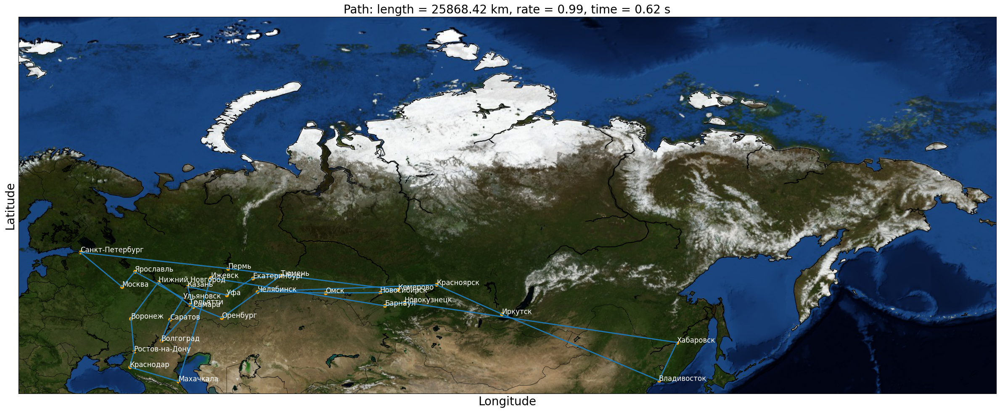

In [23]:
plot(slow_coords[-1], slow_lengths[-1], slow_cool, slow_time[-1])

### Comparing the optimization result

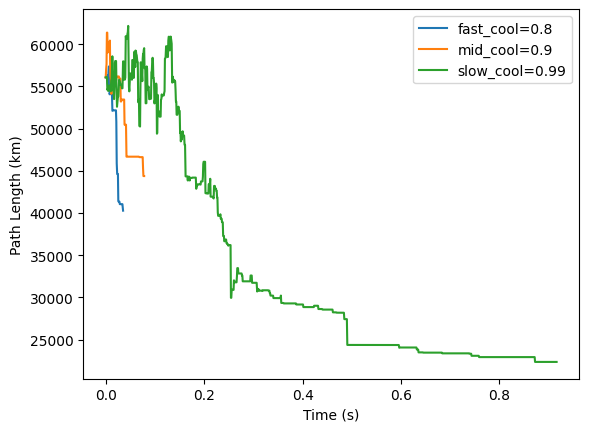

Fast Cooling: Final Path Length=40280.23 km, Execution Time=0.04 s
Middle Cooling: Final Path Length=44379.65 km, Execution Time=0.08 s
Slow Cooling: Final Path Length=22363.01 km, Execution Time=0.92 s


In [17]:
# Plot the path length as a function of time for each cooling ratio
plt.plot(fast_time, fast_lengths, label=f'fast_cool={fast_cool}')
plt.plot(mid_time, mid_lengths, label=f'mid_cool={mid_cool}')
plt.plot(slow_time, slow_lengths, label=f'slow_cool={slow_cool}')
plt.xlabel('Time (s)')
plt.ylabel('Path Length (km)')
plt.legend()
plt.show()

# Compare the final path length and execution time for each cooling ratio
print(f"Fast Cooling: Final Path Length={fast_lengths[-1]:.2f} km, Execution Time={fast_time[-1]:.2f} s")
print(f"Middle Cooling: Final Path Length={mid_lengths[-1]:.2f} km, Execution Time={mid_time[-1]:.2f} s")
print(f"Slow Cooling: Final Path Length={slow_lengths[-1]:.2f} km, Execution Time={slow_time[-1]:.2f} s")